# OOP Using Python -- VI

## **Class Inheritance or Subclasses**

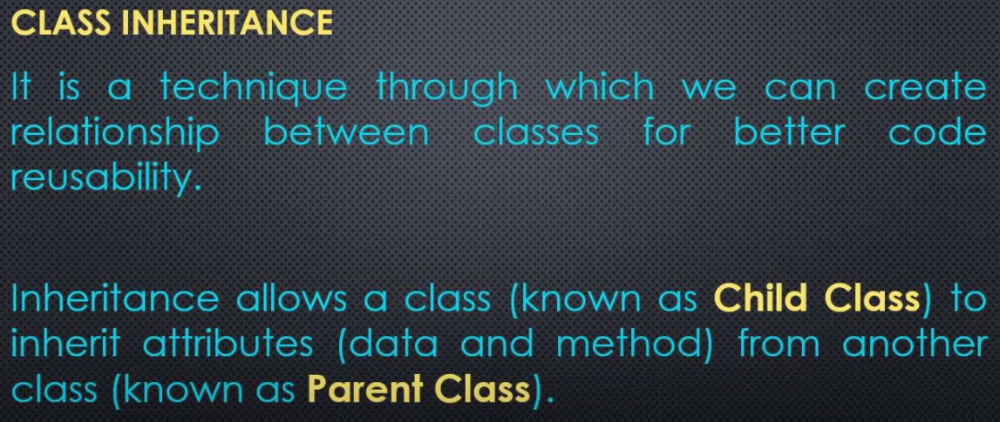

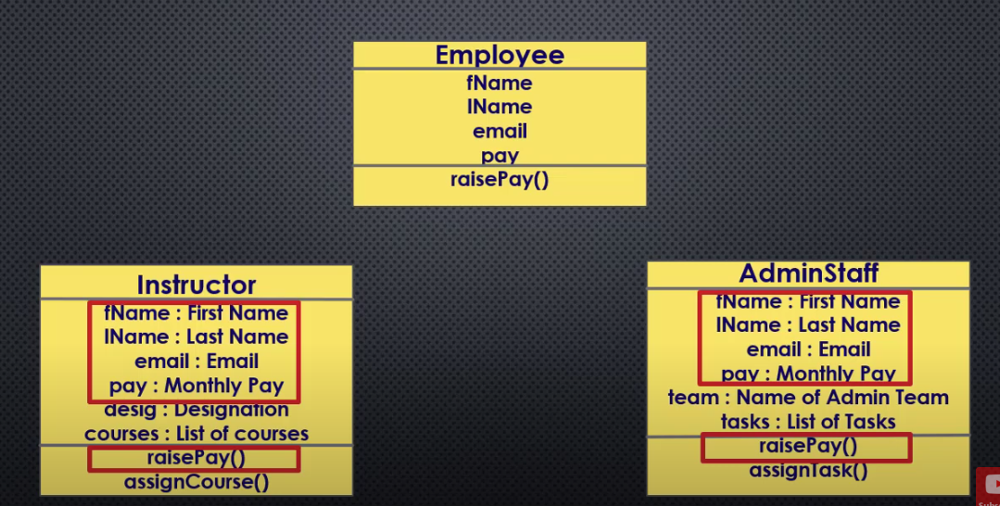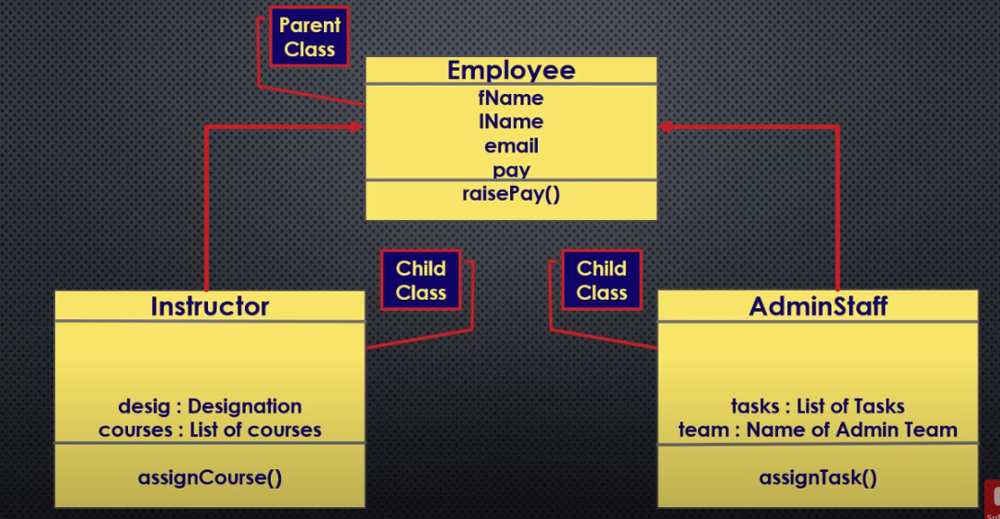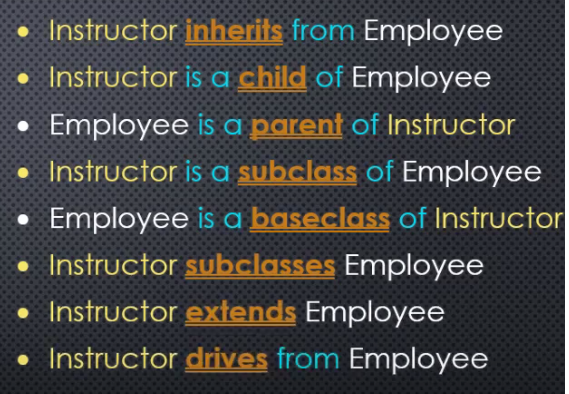

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  pass

class AdminStaff(Employee):
  pass

## Main program ##
inst1 = Instructor("Animaw", "Tadesse", 100000)
print(type(inst1))
print(isinstance(inst1, Instructor)) # True
print(isinstance(inst1, Employee)) # True
print(inst1)
print(Employee.total_emp)
print(inst1.pay)
inst1.raise_pay()
print(inst1.pay)

emp1 = Employee("Habtamu", "Mulugeta", 200000)
print(type(emp1))
print(isinstance(emp1, Instructor)) # False
print(isinstance(emp1, Employee)) # True

admin1 = AdminStaff("Habtamu", "Mulugeta", 200000)
print(type(admin1))
print(isinstance(admin1, Instructor)) # False -> no relation between the two child classes
print(isinstance(admin1, Employee)) # True
print(isinstance(admin1, AdminStaff)) # True


<class '__main__.Instructor'>
True
True
Animaw Tadesse
1
100000
110000.00000000001
<class '__main__.Employee'>
False
True
<class '__main__.AdminStaff'>
False
True
True


In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self):
    print("Inside Instructor class")

class AdminStaff(Employee):
  pass

## Main program ##
inst1 = Instructor()
print(type(inst1))
print(isinstance(inst1, Instructor)) # True
print(isinstance(inst1, Employee)) # True
inst2 = Instructor("Animaw", "Tadesse", 100000) # error b/c the __init__ methods take no argument now

Inside Instructor class
<class '__main__.Instructor'>
True
True


TypeError: Instructor.__init__() takes 1 positional argument but 4 were given

## **Method Resolution**

As seen above the `init` method of the instructor class is called.


Method resolution order specifies the order of classes in which a method is searched by the interpreter when that method is applied on any instance. As can be seen below in the help function of instructor class, the first class is the Instructor class. If not found, it will move to the next class which is the parent class, Employee. If not found then, it will move to the buildin class object. If not found, it will generate error.


Another method to look the resolution order is also to use `__mro__`.

In [ ]:
help(inst1)

Help on Instructor in module __main__ object:

class Instructor(Employee)
 |  Method resolution order:
 |      Instructor
 |      Employee
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from Employee:
 |  
 |  __repr__(self)
 |      Return repr(self).
 |  
 |  raise_pay(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from Employee:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)
 |  
 |  ----------------------------------------------------------------------
 |  Data and other attributes inherited from Employee:
 |  
 |  raise_amount = 1.1
 |  
 |  total_emp = 0



In [ ]:
print(Instructor.__mro__)

(<class '__main__.Instructor'>, <class '__main__.Employee'>, <class 'object'>)


In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank): # Note <first_name, last_name, pay> are already defined in the parent class
    # Employee.__init__(self, first_name, last_name, pay) # inherited from Employee class, first way
    super().__init__(first_name, last_name, pay) # inherited from Employee class, second way (super() refers to the parent class, no need of also inputing 'self' here)
    self.rank = rank
    self.courses = []

class AdminStaff(Employee):
  pass

## Main program ##
inst1 = Instructor("Animaw", "Tadesse", 100000, "Assistant Professor") # error becasue the __init__ methods take no argument now
print(inst1.rank)
print(inst1.courses)
print(isinstance(inst1, Instructor)) # True
print(isinstance(inst1, Employee)) # True
print(inst1)
print(Employee.total_emp)
print(inst1.pay)
inst1.raise_pay()
print(inst1.pay)


Assistant Professor
[]
True
True
Animaw Tadesse
1
100000
110000.00000000001


## **The `super()` Function**

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank): # Note <first_name, last_name, pay> are already defined in the parent class
    # Employee.__init__(self, first_name, last_name, pay) # inherited from Employee class, first way
    super().__init__(first_name, last_name, pay) # inherited from Employee class, second way (super() refers to the parent class, no need of also inputing 'self' here)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))


class AdminStaff(Employee):
  pass

## Main program ##
inst1 = Instructor("Animaw", "Tadesse", 100000, "Assistant Professor") # error becasue the __init__ methods take no argument now
print(inst1.rank)
print(inst1.courses)
inst1.assign_course("AI", "ML", "DL")
print(inst1.courses)

Assistant Professor
[]
['AI', 'ML', 'DL']


In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank): # Note <first_name, last_name, pay> are already defined in the parent class
    # Employee.__init__(self, first_name, last_name, pay) # inherited from Employee class, first way
    super().__init__(first_name, last_name, pay) # inherited from Employee class, second way (super() refers to the parent class, no need of also inputing 'self' here)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))


class AdminStaff(Employee):
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

## Main program ##
# inst1 = Instructor("Animaw", "Tadesse", 100000, "Assistant Professor") # error becasue the __init__ methods take no argument now
# print(inst1.rank)
# print(inst1.courses)
# inst1.assign_course("AI", "ML", "DL")
# print(inst1.courses)


admin1 = AdminStaff("Habtamu", "Mulugeta", 200000, "Exam")
print(admin1.team)
print(admin1.tasks)
admin1.assign_task("Exam-1", "Exam-2", "Exam-3")
print(admin1.tasks)

Exam
[]
['Exam-1', 'Exam-3', 'Exam-2']


To use a different raise_amount for the chile class, we can do as follows

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank): # Note <first_name, last_name, pay> are already defined in the parent class
    # Employee.__init__(self, first_name, last_name, pay) # inherited from Employee class, first way
    super().__init__(first_name, last_name, pay) # inherited from Employee class, second way (super() refers to the parent class, no need of also inputing 'self' here)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))


class AdminStaff(Employee):
  raise_amount = 1.15
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

inst1 = Instructor("Animaw", "Tadesse", 100000, "Assistant Professor") # error becasue the __init__ methods take no argument now
print(inst1.pay)
inst1.raise_pay()  #10%
print(inst1.pay)

admin1 = AdminStaff("Habtamu", "Mulugeta", 100000, "Exam")
print(admin1.pay)
admin1.raise_pay() #15%
print(admin1.pay)

100000
110000.00000000001
100000
114999.99999999999


If an object has an attribute

In [ ]:
print(hasattr(inst1, "raise_pay")) # True --> raise_pay in the parent class
print(hasattr(admin1, "raise_pay")) # True --> raise_pay in the parent class
print(hasattr(inst1, "assign_course")) # True --> assign_course in child class Instructor
print(hasattr(admin1, "assign_course")) # False --> assign_course in not child class AdminStaff

True
True
True
False


## **Multi-Level Inheritance**

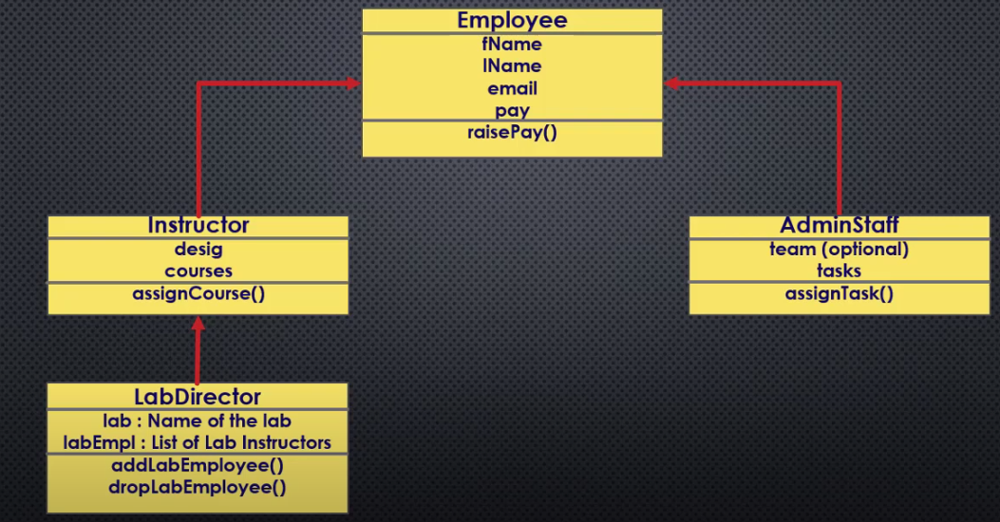

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    super().__init__(first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    super().__init__(first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
    # lab_emp should be instructor objects, should be setted using setter methods, but now we left it as it is


class AdminStaff(Employee):
  raise_amount = 1.15
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

inst1 = Instructor("Animaw", "Tadesse", 100000, "GA")
inst2 = Instructor("Habtamu", "Kiros", 20000, "Professor")
inst3 = Instructor("Alebachew", "Abebe", 300000, "Lecturer")
inst4 = Instructor("Senayit", "Seyoum", 100000, "Assistant Professor")

lab_dir1 = LabDirector("Mesfin", "Mulu", 150000, "Professor", "Applied Statistics", inst1, inst2)
print(lab_dir1.lab_emp)
lab_dir1.assign_course("Statistical Modeling", "CDA")
print(lab_dir1.courses)


[Animaw Tadesse, Habtamu Kiros]
['CDA', 'Statistical Modeling']


Let us have course assignments for lab_directors, we will use the same method function but with a different behaviour.

Prevously we have seen **Operator Overloading**, now **Method Overloading**.



In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    super().__init__(first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    super().__init__(first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)

class AdminStaff(Employee):
  raise_amount = 1.15
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

inst1 = Instructor("Animaw", "Tadesse", 100000, "GA")
inst2 = Instructor("Habtamu", "Kiros", 20000, "Professor")
inst3 = Instructor("Alebachew", "Abebe", 300000, "Lecturer")
inst4 = Instructor("Senayit", "Seyoum", 100000, "Assistant Professor")

lab_dir1 = LabDirector("Mesfin", "Mulu", 150000, "Professor", "Applied Statistics", inst1, inst2)
print(lab_dir1.lab_emp)
lab_dir1.assign_course("Statistical Modeling", "CDA")
print(lab_dir1.courses)
print(inst1.courses)
print(inst2.courses)


[Animaw Tadesse, Habtamu Kiros]
['CDA', 'Statistical Modeling']
['CDA', 'Statistical Modeling']
['CDA', 'Statistical Modeling']


In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    super().__init__(first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    super().__init__(first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)
  def add_lab_emp(self, inst):
    self.lab_emp.append(inst)
  def drop_lab_emp(self, inst):
    self.lab_emp.remove(inst)

class AdminStaff(Employee):
  raise_amount = 1.15
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

inst1 = Instructor("Animaw", "Tadesse", 100000, "GA")
inst2 = Instructor("Habtamu", "Kiros", 20000, "Professor")
inst3 = Instructor("Alebachew", "Abebe", 300000, "Lecturer")
inst4 = Instructor("Senayit", "Seyoum", 100000, "Assistant Professor")

lab_dir1 = LabDirector("Mesfin", "Mulu", 150000, "Professor", "Applied Statistics", inst1, inst2)
print(lab_dir1.lab_emp)
lab_dir1.drop_lab_emp(inst1)
print(lab_dir1.lab_emp)
lab_dir1.add_lab_emp(inst3)
print(lab_dir1.lab_emp)


[Animaw Tadesse, Habtamu Kiros]
[Habtamu Kiros]
[Habtamu Kiros, Alebachew Abebe]


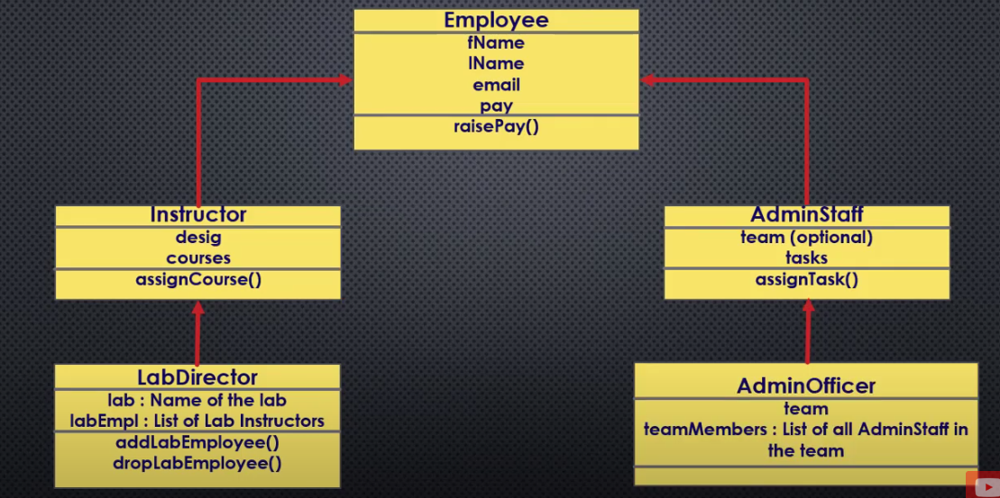

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    super().__init__(first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    super().__init__(first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)
  def add_lab_emp(self, inst):
    self.lab_emp.append(inst)
  def drop_lab_emp(self, inst):
    self.lab_emp.remove(inst)

class AdminStaff(Employee):
  raise_amount = 1.15
  all_admin_staff = []
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
    AdminStaff.all_admin_staff.append(self)

  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))
class AdminOfficer(AdminStaff):
  def __init__(self, first_name, last_name, pay, team):
    super().__init__(first_name, last_name, pay, team)
  @property
  def team_members(self):
    return list(filter(lambda s: s.team == self.team, AdminStaff.all_admin_staff))



# inst1 = Instructor("Animaw", "Tadesse", 100000, "GA")
# inst2 = Instructor("Habtamu", "Kiros", 20000, "Professor")
# inst3 = Instructor("Alebachew", "Abebe", 300000, "Lecturer")
# inst4 = Instructor("Senayit", "Seyoum", 100000, "Assistant Professor")

# lab_dir1 = LabDirector("Mesfin", "Mulu", 150000, "Professor", "Applied Statistics", inst1, inst2)
# print(lab_dir1.lab_emp)
# lab_dir1.drop_lab_emp(inst1)
# print(lab_dir1.lab_emp)
# lab_dir1.add_lab_emp(inst3)
# print(lab_dir1.lab_emp)

admin1 = AdminStaff("Habtamu", "Mulugeta", 100000, "Exam")
admin2 = AdminStaff("Abebe", "Melese", 105000, "Resource")
admin3 = AdminStaff("Melaku", "Abera", 200000, "Exam")

officer1 = AdminOfficer("Abebe", "Akalu", 50000, "Exam")
print(officer1.team_members)
print(officer1.team)


[Habtamu Mulugeta, Melaku Abera, Abebe Akalu]
Exam


## **Multiple Inheritance**

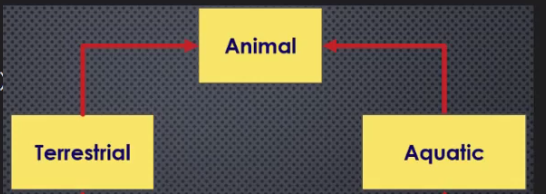

In [ ]:
class Animal:
  def breath(self):
    print("Yes, I am breathing!")

class Terrestrial(Animal):
  def walk_on_earth(self):
    print("I am walking now ...")

class Aquatic(Animal):
  def stay_in_water(self):
    print("I live in water ...")


## Main Program ##
my_dog = Terrestrial()
my_dog.breath()
my_dog.walk_on_earth()

my_fish = Aquatic()
my_fish.breath()
my_fish.stay_in_water()

Yes, I am breathing!
I am walking now ...
Yes, I am breathing!
I live in water ...


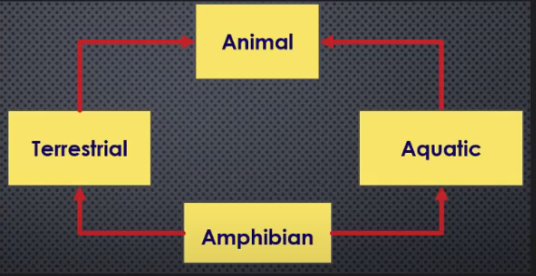

In [ ]:
class Animal:
  def breath(self):
    print("Yes, I am breathing!")

class Terrestrial(Animal):
  def walk_on_earth(self):
    print("I am walking now ...")

class Aquatic(Animal):
  def stay_in_water(self):
    print("I live in water ...")

class Amphibian(Terrestrial, Aquatic):
  pass

## Main Program ##
my_amph = Amphibian()
print(isinstance(my_amph, Animal))
print(isinstance(my_amph, Terrestrial))
print(isinstance(my_amph, Aquatic))

my_amph.breath()
my_amph.walk_on_earth()
my_amph.stay_in_water()

True
True
True
Yes, I am breathing!
I am walking now ...
I live in water ...


Order of parent classes is important. Let us see the method resolution order of Amphibian class.

In [ ]:
help(Amphibian)

Help on Amphibian in module __main__ object:

class Amphibian(Terrestrial, Aquatic)
 |  Method resolution order:
 |      Amphibian
 |      Terrestrial
 |      Aquatic
 |      Animal
 |      builtins.object
 |  
 |  Methods inherited from Terrestrial:
 |  
 |  walk_on_earth(self)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from Aquatic:
 |  
 |  stay_in_water(self)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from Animal:
 |  
 |  breath(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from Animal:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



In [ ]:
class Animal:
  def breath(self):
    print("Yes, I am breathing!")

class Terrestrial(Animal):
  def walk_on_earth(self):
    print("I am walking now ...")
  def stay_in_water(self):
    print("I cannot live in water.")

class Aquatic(Animal):
  def stay_in_water(self):
    print("I live in water ...")
  def walk_on_earth(self):
    print("I cannot walk on earth")

class Amphibian(Terrestrial, Aquatic):
  pass

## Main Program ##
my_amph = Amphibian()
print(isinstance(my_amph, Animal))
print(isinstance(my_amph, Terrestrial))
print(isinstance(my_amph, Aquatic))

my_amph.breath()
my_amph.walk_on_earth() # inherited from Terrestrial
my_amph.stay_in_water() # inherited from Terrestrial
# we need to inherit walk_on_earth from terristrial and stay_in_water from Aquatic

True
True
True
Yes, I am breathing!
I am walking now ...
I cannot live in water.


In [ ]:
class Animal:
  def breath(self):
    print("Yes, I am breathing!")

class Terrestrial(Animal):
  def walk_on_earth(self):
    print("I am walking now ...")
  def stay_in_water(self):
    print("I cannot live in water.")

class Aquatic(Animal):
  def stay_in_water(self):
    print("I live in water ...")
  def walk_on_earth(self):
    print("I cannot walk on earth")

class Amphibian(Terrestrial, Aquatic):
  def stay_in_water(self):
    Aquatic.stay_in_water(self)

## Main Program ##
my_amph = Amphibian()
print(isinstance(my_amph, Animal))
print(isinstance(my_amph, Terrestrial))
print(isinstance(my_amph, Aquatic))

my_amph.breath()
my_amph.walk_on_earth() # inherited from Terrestrial
my_amph.stay_in_water() # inherited from Aquatic

True
True
True
Yes, I am breathing!
I am walking now ...
I live in water ...


If we have some extended feature, say for walk_on_earth for Amphibian Class; we can use method overriding concept.

In [ ]:
class Animal:
  def breath(self):
    print("Yes, I am breathing!")

class Terrestrial(Animal):
  def walk_on_earth(self):
    print("I am walking now ...")
  def stay_in_water(self):
    print("I cannot live in water.")

class Aquatic(Animal):
  def stay_in_water(self):
    print("I live in water ...")
  def walk_on_earth(self):
    print("I cannot walk on earth")

class Amphibian(Terrestrial, Aquatic):
  def walk_on_earth(self):
    # super().walk_on_earth() # oneway
    Terrestrial.walk_on_earth(self) # other way
    print("I love walking.") # extended behaviour

  def stay_in_water(self):
    Aquatic.stay_in_water(self)

## Main Program ##
my_amph = Amphibian()
print(isinstance(my_amph, Animal))
print(isinstance(my_amph, Terrestrial))
print(isinstance(my_amph, Aquatic))

my_amph.breath()
my_amph.walk_on_earth()
my_amph.stay_in_water()

True
True
True
Yes, I am breathing!
I am walking now ...
I love walking.
I live in water ...


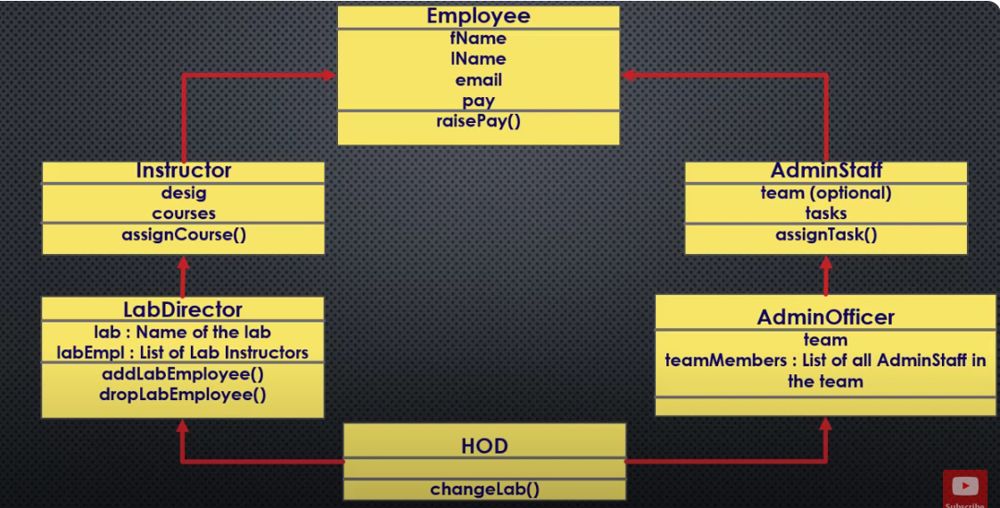

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    super().__init__(first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    super().__init__(first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)
  def add_lab_emp(self, inst):
    self.lab_emp.append(inst)
  def drop_lab_emp(self, inst):
    self.lab_emp.remove(inst)

class AdminStaff(Employee):
  raise_amount = 1.15
  all_admin_staff = []
  def __init__(self, first_name, last_name, pay, team = None):
    super().__init__(first_name, last_name, pay)
    self.team = team
    self.tasks = []
    AdminStaff.all_admin_staff.append(self)

  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))
class AdminOfficer(AdminStaff):
  def __init__(self, first_name, last_name, pay, team):
    super().__init__(first_name, last_name, pay, team)
  @property
  def team_members(self):
    return list(filter(lambda s: s.team == self.team, AdminStaff.all_admin_staff))

class HOD(LabDirector, AdminOfficer):
  pass

help(HOD)


Help on class HOD in module __main__:

class HOD(LabDirector, AdminOfficer)
 |  HOD(first_name, last_name, pay, design, lab, *lab_emp)
 |  
 |  Method resolution order:
 |      HOD
 |      LabDirector
 |      Instructor
 |      AdminOfficer
 |      AdminStaff
 |      Employee
 |      builtins.object
 |  
 |  Methods inherited from LabDirector:
 |  
 |  __init__(self, first_name, last_name, pay, design, lab, *lab_emp)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  add_lab_emp(self, inst)
 |  
 |  assign_course(self, *course)
 |  
 |  drop_lab_emp(self, inst)
 |  
 |  ----------------------------------------------------------------------
 |  Readonly properties inherited from AdminOfficer:
 |  
 |  team_members
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from AdminStaff:
 |  
 |  assign_task(self, *task)
 |  
 |  ----------------------------------------------------------------------
 |  Data and ot

We added an HOD class below. We also replaced super() function by the corresponding parent class for ease of clarity of the complete heirarchy

In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    Employee.__init__(self, first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    Instructor.__init__(self, first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)
  def add_lab_emp(self, inst):
    self.lab_emp.append(inst)
  def drop_lab_emp(self, inst):
    self.lab_emp.remove(inst)

class AdminStaff(Employee):
  raise_amount = 1.15
  all_admin_staff = []
  def __init__(self, first_name, last_name, pay, team = None):
    Employee.__init__(self, first_name, last_name, pay)
    self.team = team
    self.tasks = []
    AdminStaff.all_admin_staff.append(self)

  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

class AdminOfficer(AdminStaff):
  def __init__(self, first_name, last_name, pay, team):
    AdminStaff.__init__(self, first_name, last_name, pay, team)
  @property
  def team_members(self):
    return list(filter(lambda s: s.team == self.team, AdminStaff.all_admin_staff))

class HOD(LabDirector, AdminOfficer):
  def __init__(self, first_name, last_name, pay, rank, lab, lab_emp = None):
    LabDirector.__init__(self, first_name, last_name, pay, rank, lab, lab_emp)
    AdminOfficer.__init__(self, first_name, last_name, pay, team = "Admin") # team of HOD = admin dean (can also do: self.team = Admin)
  @property
  def team_members(self):
    return AdminStaff.all_admin_staff


head = HOD("Hussien", "Najimul", 120000, "Associate Professor", "ML")

admin1 = AdminStaff("Habtamu", "Mulugeta", 100000, "Exam")
admin2 = AdminStaff("Abebe", "Melese", 105000, "Resource")
admin3 = AdminStaff("Melaku", "Abera", 200000, "Exam")

officer1 = AdminOfficer("Abebe", "Akalu", 50000, "Exam")

print(head.team_members)


[Hussien Najimul, Habtamu Mulugeta, Abebe Melese, Melaku Abera, Abebe Akalu]


In [ ]:
class Employee:
  raise_amount = 1.1
  total_emp = 0
  def __init__(self, first_name, last_name, pay):
    self.first_name = first_name
    self.last_name = last_name
    self.pay = pay
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pknu.ac.kr"
    Employee.total_emp +=1
  def raise_pay(self):
    self.pay *= self.raise_amount
  def __repr__(self):
    return f"{self.first_name} {self.last_name}"

class Instructor(Employee):
  def __init__(self, first_name, last_name, pay, rank):
    Employee.__init__(self, first_name, last_name, pay)
    self.rank = rank
    self.courses = []
  def assign_course(self, *course):
    self.courses = list(set(self.courses + list(course)))

class LabDirector(Instructor): # LabDirector is an instance of Instructor class, and also Employee class
  def __init__(self, first_name, last_name, pay, design, lab, *lab_emp):
    Instructor.__init__(self, first_name, last_name, pay, design)
    self.lab = lab
    self.lab_emp = list(lab_emp)
  def assign_course(self, *course): # same as assigning to Instructor
    super().assign_course(*course) # assign first to lab director
    for inst in self.lab_emp:
      inst.assign_course(*course)
  def add_lab_emp(self, inst):
    self.lab_emp.append(inst)
  def drop_lab_emp(self, inst):
    self.lab_emp.remove(inst)

class AdminStaff(Employee):
  raise_amount = 1.15
  all_admin_staff = []
  def __init__(self, first_name, last_name, pay, team = None):
    Employee.__init__(self, first_name, last_name, pay)
    self.team = team
    self.tasks = []
    AdminStaff.all_admin_staff.append(self)

  def assign_task(self, *task):
    self.tasks  = list(set(self.tasks + list(task)))

class AdminOfficer(AdminStaff):
  def __init__(self, first_name, last_name, pay, team):
    AdminStaff.__init__(self, first_name, last_name, pay, team)
  @property
  def team_members(self):
    return list(filter(lambda s: s.team == self.team, AdminStaff.all_admin_staff))

class HOD(LabDirector, AdminOfficer):
  def __init__(self, first_name, last_name, pay, rank, lab, lab_emp = None):
    LabDirector.__init__(self, first_name, last_name, pay, rank, lab, lab_emp)
    AdminOfficer.__init__(self, first_name, last_name, pay, team = "Admin") # team of HOD = admin dean (can also do: self.team = Admin)
  @property
  def team_members(self):
    return AdminStaff.all_admin_staff
  def change_lab(self, LD, new_lab):
    LD.lab = new_lab


head = HOD("Hussien", "Najimul", 120000, "Associate Professor", "ML")

inst1 = Instructor("Animaw", "Tadesse", 100000, "GA")
inst2 = Instructor("Habtamu", "Kiros", 20000, "Professor")
inst3 = Instructor("Alebachew", "Abebe", 300000, "Lecturer")
inst4 = Instructor("Senayit", "Seyoum", 100000, "Assistant Professor")

lab_dir1 = LabDirector("Mesfin", "Mulu", 150000, "Professor", "Applied Statistics", inst1, inst2)
print(lab_dir1.lab_emp)

admin1 = AdminStaff("Habtamu", "Mulugeta", 100000, "Exam")
admin2 = AdminStaff("Abebe", "Melese", 105000, "Resource")
admin3 = AdminStaff("Melaku", "Abera", 200000, "Exam")

officer1 = AdminOfficer("Abebe", "Akalu", 50000, "Exam")

print(lab_dir1.lab)
head.change_lab(lab_dir1, "Computing")
print(lab_dir1.lab)


[Animaw Tadesse, Habtamu Kiros]
Applied Statistics
Computing


## **Composition and Inheritance**

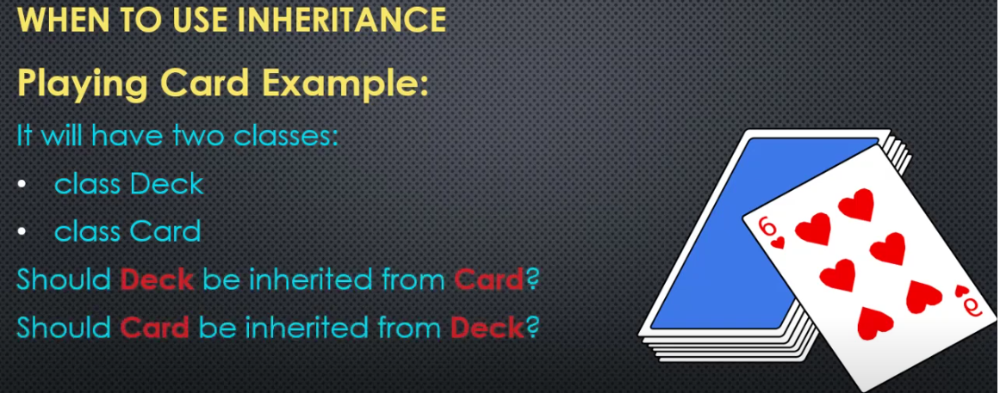

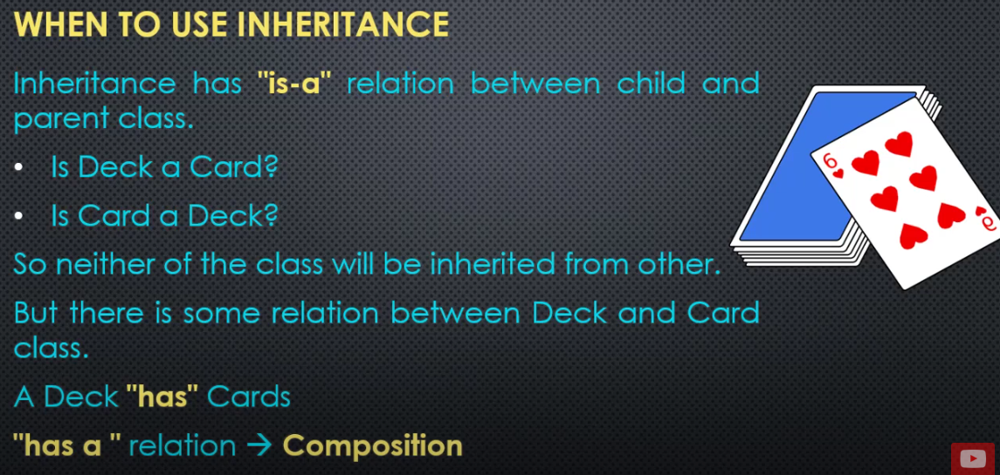

In [ ]:
import random

class Card:
  def __init__(self, suit, value):
    self.suit = suit
    self.value = value
  def __repr__(self):
    return f"{self.value}-{self.suit}"

class Deck:
  def __init__(self):
    self.cards = []
    for s in ["Spade", "Club", "Diamond", "Heart"]:
      for v in ["A", "2", "3", "4", "5", "6", "7", "8", "9", "10", "J", "Q", "K"]:
        self.cards.append(Card(s,v)) # This is composition: creating objects of another class while creating the objects of some class
  def shuffle(self):
    random.shuffle(self.cards)
  def __repr__(self):
    return repr(self.cards)


d = Deck()
d.shuffle()
print(d)

[9-Diamond, 4-Spade, 5-Spade, 9-Spade, A-Heart, J-Club, 8-Heart, Q-Club, 5-Heart, J-Spade, A-Club, 9-Club, 9-Heart, K-Diamond, Q-Heart, 2-Spade, 7-Club, 2-Heart, Q-Diamond, 7-Diamond, Q-Spade, 3-Heart, A-Spade, K-Heart, 10-Heart, 6-Spade, 3-Spade, J-Diamond, 6-Club, 8-Spade, K-Club, 6-Diamond, 7-Heart, 7-Spade, J-Heart, A-Diamond, 3-Diamond, 6-Heart, 3-Club, 10-Club, 4-Club, 8-Diamond, K-Spade, 4-Diamond, 10-Diamond, 8-Club, 10-Spade, 5-Diamond, 2-Club, 4-Heart, 5-Club, 2-Diamond]


## **Abstract Class**

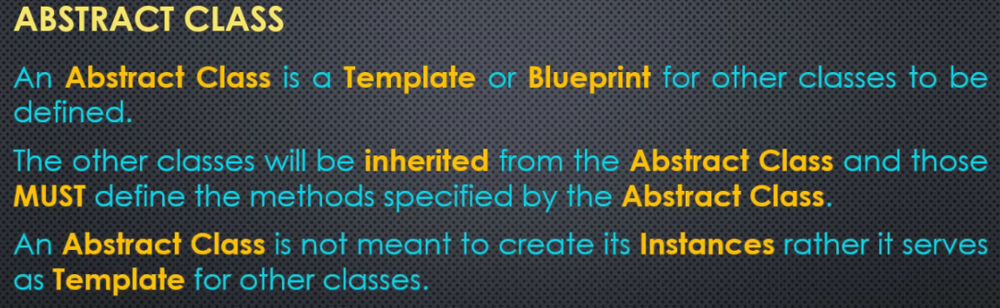

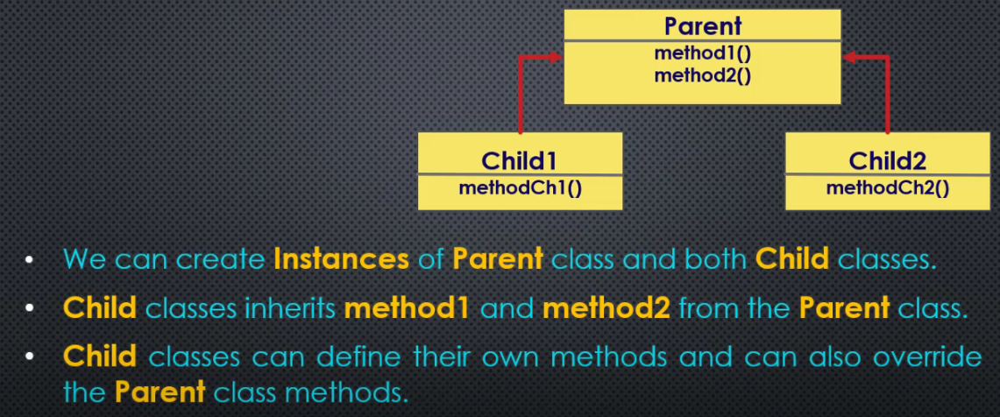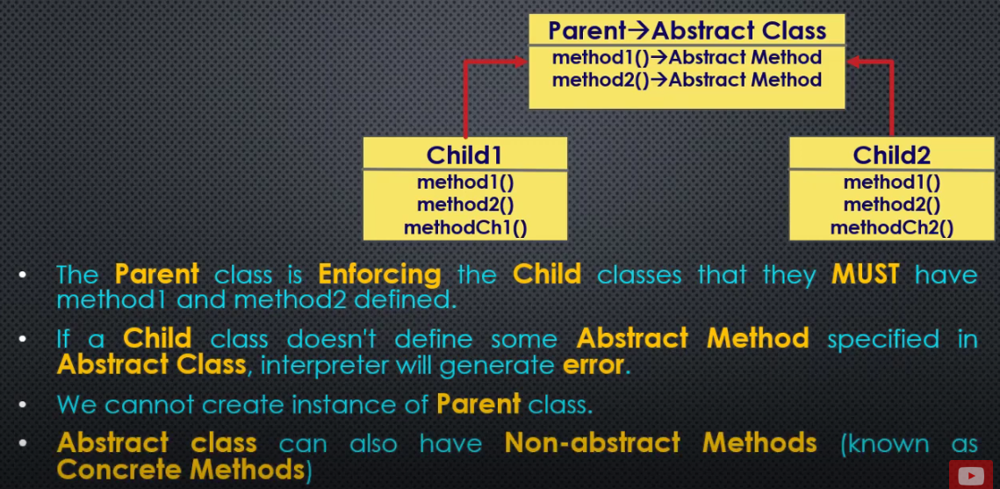

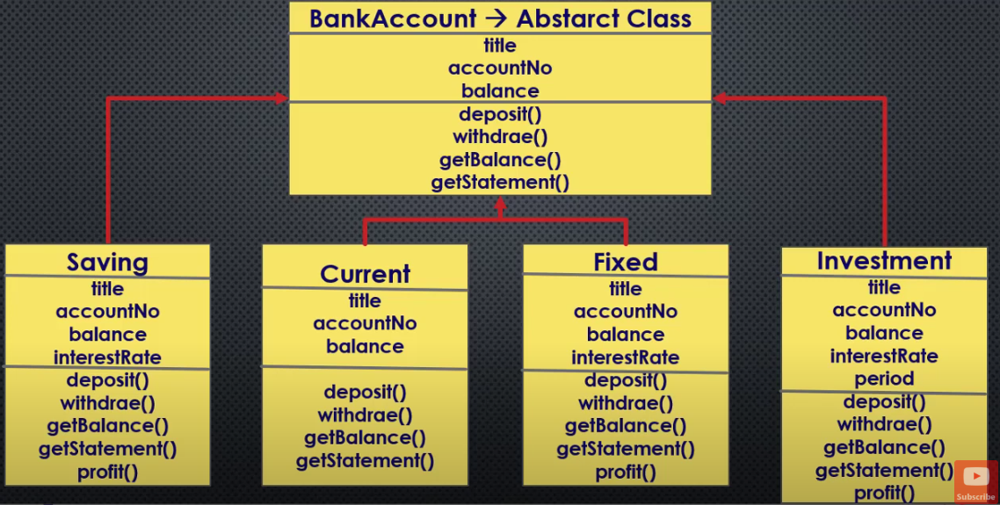

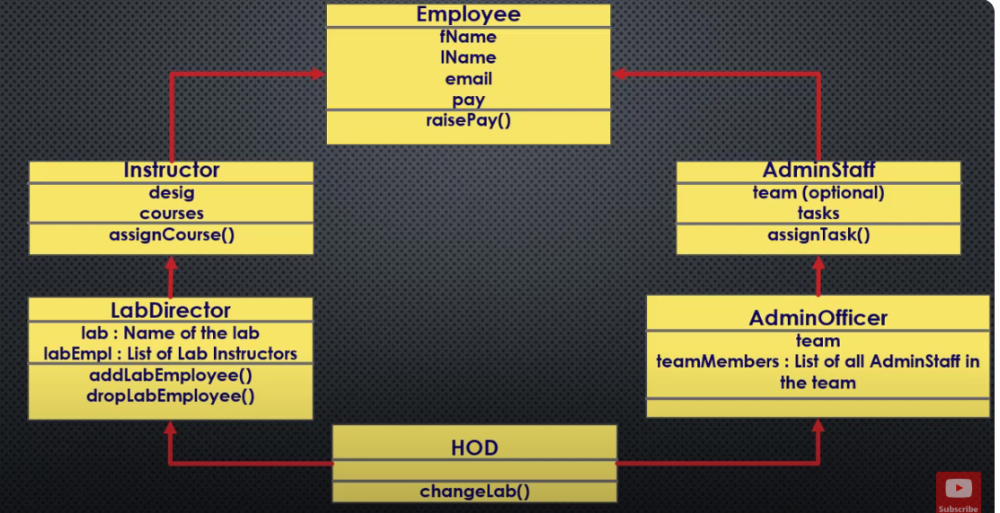

We do not create Employee class directly. So if we convert the employee class to an abstract class, it will prevent creating Employee class directly.

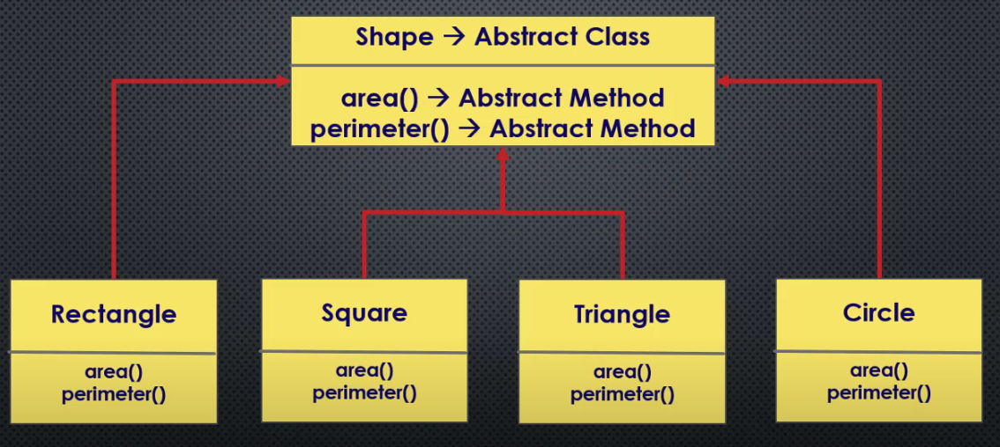

In [ ]:
from abc import ABC

class Shape(ABC):
  pass

## Main Program ##
s = Shape() # No error so class Shape is not an abstract class
            # Becasue there must be atleast one abstract method

In [ ]:
from abc import ABC, abstractmethod
class Shape(ABC):
  @abstractmethod
  def area(self):
    pass

## Main Program ##
s = Shape() # error, we achieved the first feature

TypeError: Can't instantiate abstract class Shape with abstract method area

In [ ]:
from abc import ABC, abstractmethod
class Shape(ABC):
  @abstractmethod
  def area(self):
    pass
class Rectangle(Shape):
  pass
## Main Program ##
rect = Rectangle() # error, we must defined area method in the Rectangle class

TypeError: Can't instantiate abstract class Rectangle with abstract method area

In [ ]:
class Shape(ABC):
  @abstractmethod
  def area(self):
    pass
class Rectangle(Shape):
  def __init__(self, l, b):
    self.l = l
    self.b = b
  def area(self):
    return self.l * self.b
## Main Program ##
rect = Rectangle(5, 6)
print(rect.area())

30


In [ ]:
class Shape(ABC):
  @abstractmethod
  def area(self):
    pass
class Rectangle(Shape):
  def __init__(self, l, b):
    self.l = l
    self.b = b
  def area(self):
    return self.l * self.b
  def perimeter(self): #non-abstract method
    pass

## Main Program ##
rect = Rectangle(5, 6) # can have rectangle class without perimeter method
print(rect.area())

30


In [ ]:
class Shape(ABC):
  @abstractmethod
  def area(self):
    print("Area Claculation!")
class Rectangle(Shape):
  def __init__(self, l, b):
    self.l = l
    self.b = b
  def area(self):
    return self.l * self.b # this are method overrides the method in the abstract class
  def perimeter(self): #non-abstract method
    pass

## Main Program ##
rect = Rectangle(5, 6) # can have rectangle class without perimeter method
print(rect.area())

30


In [ ]:
class Shape(ABC):
  @abstractmethod
  def area(self):
    print("Area Claculation!")
class Rectangle(Shape):
  def __init__(self, l, b):
    self.l = l
    self.b = b
  def area(self):
    super().area() # to use the method defined in the abstract class
  def perimeter(self): #non-abstract method
    pass

## Main Program ##
rect = Rectangle(5, 6) # can have rectangle class without perimeter method
print(rect.area()) # no output here

Area Claculation!
None


In [ ]:
class Shape(ABC):
  @abstractmethod
  def area(self):
    print("Area Claculation!")
class Rectangle(Shape):
  def __init__(self, l, b):
    self.l = l
    self.b = b
  def area(self):
    super().area()
    return self.l * self.b # extended logic
  def perimeter(self): #non-abstract method
    pass

## Main Program ##
rect = Rectangle(5, 6)
print(rect.area())

Area Claculation!
30


In [ ]:
class Shape(ABC):
  @abstractmethod
  def __init__(self, units):
    self.units = units # common
  @abstractmethod
  def area(self):
    print("Area Claculation!")
class Rectangle(Shape):
  def __init__(self, l, b, units):
    super().__init__(units)
    self.l = l
    self.b = b
  def area(self):
    super().area()
    return self.l * self.b
  def perimeter(self):
    pass

## Main Program ##
rect = Rectangle(5, 6, "cm")
print(rect.area())

Area Claculation!
30
